# Л.Р. #1 — Градиентный спуск и его модификации
    *   Выбрать тестовые функции оптимизации (2 шт),
    *   Запрограммировать собственную реализацию классического градиентного спуска,
    *   Запрограммировать пайплайн тестирования алгоритма оптимизации,
      *   Визуализации функции и точки оптимума,
      *   Вычисление погрешности найденного решения в сравнение с аналитическим для нескольких запусков,
      *   Визуализации точки найденного решения (можно добавить анимацию на плюс балл),
    *   Запрограммировать метод вычисления градиента,
      *   Передача функции градиента от пользователя,
      *   Символьное вычисление градиента (например с помощью sympy) (на доп балл),
      *   Численная аппроксимация градиента (на доп балл),
    *   Запрограммировать одну моментную модификацию и протестировать ее,
    *   Запрограммировать одну адаптивную модификацию и протестировать ее,
    *   Запрограммировать метод эфолюции темпа обучения и/или метод выбора начального приближения и протестировать их

Импортируем необходимые библиотеки и типы

In [344]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from collections.abc import Callable
from typing import Mapping
from functools import lru_cache

Устанавливаем используемые символы

In [345]:
X, Y = sp.symbols('x y')

Задаем функцию МакКормика в символьном виде при помощи библиотеки sympy. Проверяем корректность ее выхода.

In [346]:
def f1_sympy(x: sp.Symbol, y: sp.Symbol) -> sp.Expr:
    return sp.sin(x + y) + (x - y)**2 - 1.5*x + 2.5*y + 1

f1_name = "McCormick Function"
wiki_x1 = -0.54719
wiki_y1 = -1.54719
wiki_z1 = -1.9133


def f2_sympy(x: sp.Symbol, y: sp.Symbol) -> sp.Expr:
    return 0.26*(x**2+y**2) - 0.48 * x * y

f2_name = "Mathias function"
wiki_x2 = 0
wiki_y2 = 0
wiki_z2 = 0

print(f1_sympy(X, Y))
print(f2_sympy(X, Y))

-1.5*x + 2.5*y + (x - y)**2 + sin(x + y) + 1
0.26*x**2 - 0.48*x*y + 0.26*y**2


С использованием библиотеки sympy преобразуем символьные выражения в labda-функцию для дальнейших вычислений с помощью numpy

In [347]:
f1_numpy: Callable[..., np.ndarray] = sp.lambdify((X, Y), f1_sympy(X, Y), 'numpy')
f2_numpy: Callable[..., np.ndarray] = sp.lambdify((X, Y), f2_sympy(X, Y), 'numpy')
print(f"Type of f_numpy: {type(f1_numpy)}")
print(f"Type of f_numpy: {type(f2_numpy)}")

Type of f_numpy: <class 'function'>
Type of f_numpy: <class 'function'>


Получаем символьные производные и приводим их к numpy lambda-функциям при помощи библиотеки sympy

In [348]:
@lru_cache
def get_derivatives(f: Callable, args: tuple) -> list[Callable[..., np.ndarray]]:
  derivatives_funcs: list[Callable[..., np.ndarray]] = []
  for i in args:
    sympy_df_dx: sp.Expr = sp.diff(f(*args), i)
    df_di: Callable[..., np.ndarray] = sp.lambdify(tuple(args), sympy_df_dx, 'numpy')
    derivatives_funcs.append(df_di)
  return derivatives_funcs
print(get_derivatives(f1_sympy, (X, Y)))

[<function _lambdifygenerated at 0x7faf69bb15a0>, <function _lambdifygenerated at 0x7faf69bb1bd0>]


Задаем сетки графиков

In [349]:
x1: np.ndarray = np.linspace(-1.5, 4, 400)
y1: np.ndarray = np.linspace(-3, 4, 400)
x1, y1 = np.meshgrid(x1, y1)
z1: np.ndarray = f1_numpy(x1, y1)

x2: np.ndarray = np.linspace(-10, 10, 400)
y2: np.ndarray = np.linspace(-10, 10, 400)
x2, y2 = np.meshgrid(x2, y2)
z2: np.ndarray = f2_numpy(x2, y2)

Визуализируем поверхность для визуальной проверки

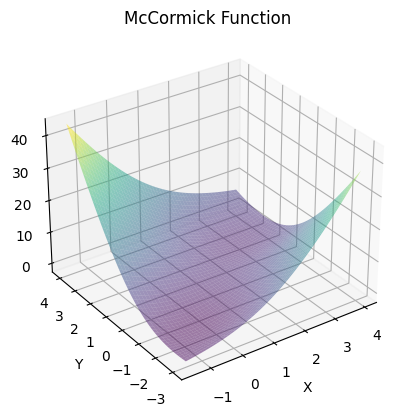

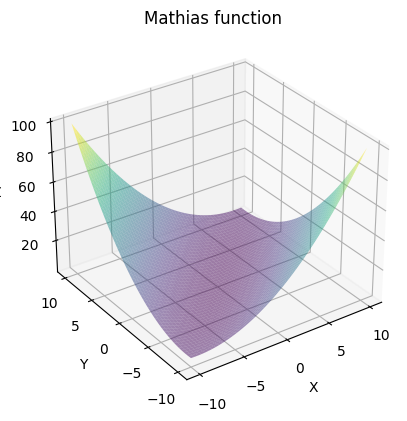

In [350]:
def show_plot(x: np.ndarray, y: np.ndarray, z: np.ndarray, f_numpy: Callable[..., np.ndarray], func_name: str, history = None):
  fig = plt.figure()
  ax = fig.add_subplot(projection='3d')
  ax.plot_surface(x, y, z, cmap='viridis', alpha=0.5)

  # Настройка графика
  ax.set_title(func_name)
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('Z')

  # Подкручиваем вид, чтобы было как в википедии
  ax.view_init(azim=-125)
  if history is not None:
    ax.scatter(history[:, 0], history[:, 1], f_numpy(history[:, 0], history[:, 1]), color='red', marker='o')
  # Обображаем график
  plt.show()
show_plot(x1, y1, z1, f1_numpy, f1_name)
show_plot(x2, y2, z2, f2_numpy, f2_name)

Объявляем функцию вычисления градиента (используем символьно вычисленные, объявленное ранее)

In [351]:
def gradient(f: Callable, point: tuple, derivatives_args: tuple = (X, Y)) -> np.ndarray:
  derivatives_funcs = get_derivatives(f, derivatives_args)
  derivatives = []
  for i in range(len(derivatives_args)):
    derivatives.append(derivatives_funcs[i](*point))
  return np.array(derivatives)

Объявляем функцию численной аппроксимации градиента путем центральной конечной разности.

In [352]:
def numerical_gradient_approximation(f: Callable, point: tuple, epsilon=1e-6) -> np.ndarray:
    x = point[0]
    y = point[1]
    df_dx_approx = (f(x + epsilon, y) - f(x - epsilon, y)) / (2 * epsilon)
    df_dy_approx = (f(x, y + epsilon) - f(x, y - epsilon)) / (2 * epsilon)
    return np.array([df_dx_approx, df_dy_approx])

Реализуем градиентный спуск

In [353]:
def gradient_descent(f: Callable, starting_point, learning_rate, iterations, gradient: Callable[..., np.ndarray]) -> np.ndarray:
    history = []
    current_point = starting_point.copy()

    for _ in range(iterations):
        gradient_at_point = gradient(f, current_point)
        current_point = current_point - learning_rate * gradient_at_point
        history.append(current_point.copy())
        if len(history) > 1 and np.allclose(history[-1], history[-2], atol=1e-6, rtol=1e-6):
          return np.array(history)

    return np.array(history)

Начальная точка и параметры градиентного спуска

In [354]:
initial_point_1 = np.array([-1.0, 3.0])
initial_point_2 = np.array([-3.0, 3.0])
learning_rate = 0.1
iterations = 1000

Функция для сравнения полученных результатов с результатами из википедии

In [355]:
def difference(point, wiki_x, wiki_y, wiki_z, f_numpy, f_name):
  print(f"Минимум {f_name} в {point}")
  print(f"Значение функции {f_name} в минимуме: {f_numpy(*point)}")
  print("Разница между вычисленным и из википедии")
  print(f"x: {abs(wiki_x - point[0])}, y: {abs(wiki_y - point[1])}, z: {abs(wiki_z - f_numpy(*point))}\n")

Запуск градиентного спуска с градиентом, получаемым в результате символьного вычисления производных в sympy

Минимум McCormick Function в [-0.54719051 -1.54719051]
Значение функции McCormick Function в минимуме: -1.9132229548952768
Разница между вычисленным и из википедии
x: 5.146343940998221e-07, y: 5.146343939887998e-07, z: 7.704510472317239e-05



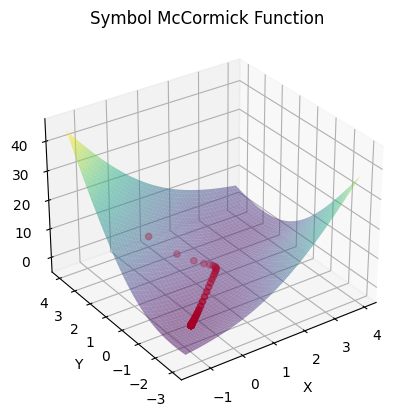

Минимум Mathias function в [-8.71896425e-06  8.71896425e-06]
Значение функции Mathias function в минимуме: 7.60203375682968e-11
Разница между вычисленным и из википедии
x: 8.718964248596092e-06, y: 8.718964248596092e-06, z: 7.60203375682968e-11



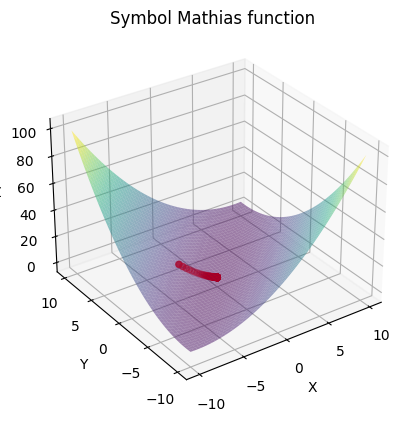

In [356]:
symbol_trajectory_1: np.ndarray = gradient_descent(f1_sympy, initial_point_1, learning_rate, iterations, gradient)
symbol_final_point_1 = symbol_trajectory_1[-1]
difference(symbol_final_point_1, wiki_x1, wiki_y1, wiki_z1, f1_numpy, f1_name)
show_plot(x1, y1, z1, f1_numpy, "Symbol " + f1_name, symbol_trajectory_1)

symbol_trajectory_2: np.ndarray = gradient_descent(f2_sympy, initial_point_2, learning_rate, iterations, gradient)
symbol_final_point_2 = symbol_trajectory_2[-1]
difference(symbol_final_point_2, wiki_x2, wiki_y2, wiki_z2, f2_numpy, f2_name)
show_plot(x2, y2, z2, f2_numpy, "Symbol " + f2_name, symbol_trajectory_2)

Запуск градиентного спуска с градиентом, получаемым в результате численного аппроксимирования

Минимум McCormick Function в [-0.54719051 -1.54719051]
Значение функции McCormick Function в минимуме: -1.9132229548952768
Разница между вычисленным и из википедии
x: 5.146343940998221e-07, y: 5.146343939887998e-07, z: 7.704510472317239e-05



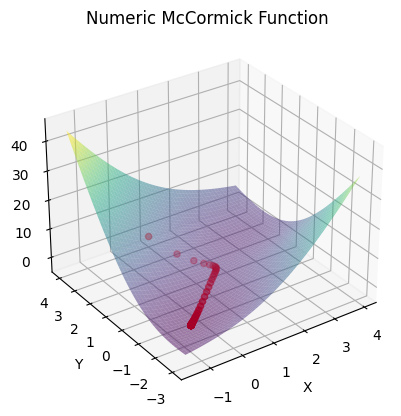

Минимум Mathias function в [-8.71896425e-06  8.71896425e-06]
Значение функции Mathias function в минимуме: 7.60203375682968e-11
Разница между вычисленным и из википедии
x: 8.718964248596092e-06, y: 8.718964248596092e-06, z: 7.60203375682968e-11



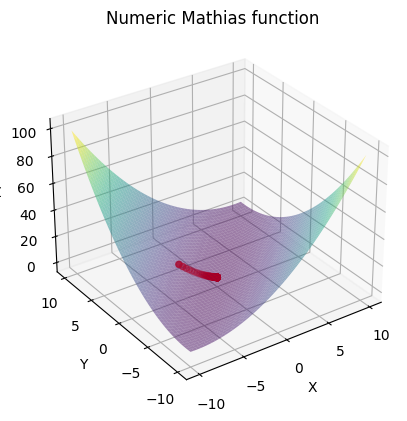

In [357]:
numeric_trajectory_1: np.ndarray = gradient_descent(f1_numpy, initial_point_1, learning_rate, iterations, numerical_gradient_approximation)
numeric_final_point_1 = symbol_trajectory_1[-1]
difference(numeric_final_point_1, wiki_x1, wiki_y1, wiki_z1, f1_numpy, f1_name)
show_plot(x1, y1, z1, f1_numpy, "Numeric " + f1_name, symbol_trajectory_1)

numeric_trajectory_2: np.ndarray = gradient_descent(f2_numpy, initial_point_2, learning_rate, iterations, numerical_gradient_approximation)
numeric_final_point_2 = symbol_trajectory_2[-1]
difference(numeric_final_point_2, wiki_x2, wiki_y2, wiki_z2, f2_numpy, f2_name)
show_plot(x2, y2, z2, f2_numpy, "Numeric " + f2_name, symbol_trajectory_2)

Добавляем "моментную" реализацию градиентного спуска

In [358]:
def gradient_descent_with_momentum(f: Callable,
                                   starting_point: np.ndarray,
                                   learning_rate: float,
                                   iterations: int,
                                   gradient: Callable[..., np.ndarray],
                                   momentum_factor: float = 0.2) -> np.ndarray:
    history = []
    current_point = np.array(starting_point)
    velocity = np.zeros_like(current_point)

    for _ in range(iterations):
        gradient_at_point = gradient(f, current_point)
        velocity = momentum_factor * velocity - learning_rate * gradient_at_point
        current_point += velocity
        history.append(current_point.copy())
        if len(history) > 1 and np.allclose(history[-1], history[-2], atol=1e-6, rtol=1e-6):
          return np.array(history)

    return np.array(history)

Отображаем результаты моментного градиентного спуска

Минимум McCormick Function в [-0.54719254 -1.54719254]
Значение функции McCormick Function в минимуме: -1.91322295493746
Разница между вычисленным и из википедии
x: 2.535377762957758e-06, y: 2.5353777628467355e-06, z: 7.704506254002652e-05



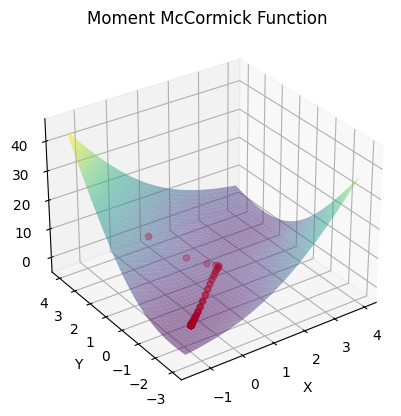

Минимум Mathias function в [-6.5924146e-06  6.5924146e-06]
Значение функции Mathias function в минимуме: 4.3459930203090214e-11
Разница между вычисленным и из википедии
x: 6.592414595813147e-06, y: 6.592414595813147e-06, z: 4.3459930203090214e-11



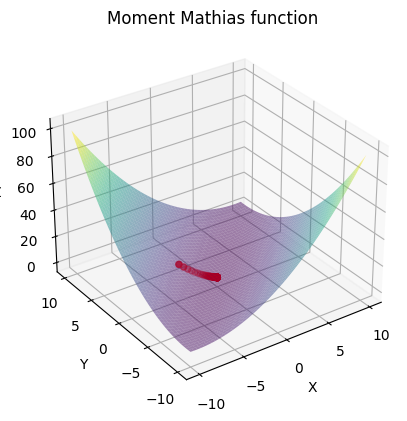

In [359]:
moment_trajectory_1: np.ndarray = gradient_descent_with_momentum(f1_sympy, initial_point_1, learning_rate, iterations, gradient)
moment_final_point_1 = moment_trajectory_1[-1]
difference(moment_final_point_1, wiki_x1, wiki_y1, wiki_z1, f1_numpy, f1_name)
show_plot(x1, y1, z1, f1_numpy, "Moment " + f1_name, moment_trajectory_1)

moment_trajectory_2: np.ndarray = gradient_descent_with_momentum(f2_sympy, initial_point_2, learning_rate, iterations, gradient)
moment_final_point_2 = moment_trajectory_2[-1]
difference(moment_final_point_2, wiki_x2, wiki_y2, wiki_z2, f2_numpy, f2_name)
show_plot(x2, y2, z2, f2_numpy, "Moment " + f2_name, moment_trajectory_2)

Добавляем adam реализацию градиентного спуска

In [360]:
def adagrad(f, initial_point, learning_rate, iterations, gradient, epsilon=1e-4):
    history = []
    current_point = np.array(initial_point)
    accumulated_gradients = np.zeros_like(current_point)

    for _ in range(iterations):
        gradient_at_point = gradient(f, current_point)
        accumulated_gradients += gradient_at_point**2
        adjusted_learning_rate = learning_rate / (np.sqrt(accumulated_gradients) + epsilon)
        current_point -= adjusted_learning_rate * gradient_at_point
        history.append(current_point.copy())
        if len(history) > 1 and np.allclose(history[-1], history[-2], atol=1e-6, rtol=1e-6):
          return np.array(history)
    return np.array(history)

Отображаем результаты Adam

Минимум McCormick Function в [-0.33058191 -1.32058811]
Значение функции McCormick Function в минимуме: -1.8222569098788068
Разница между вычисленным и из википедии
x: 0.21660808570309226, y: 0.2266018875563729, z: 0.09104309012119316



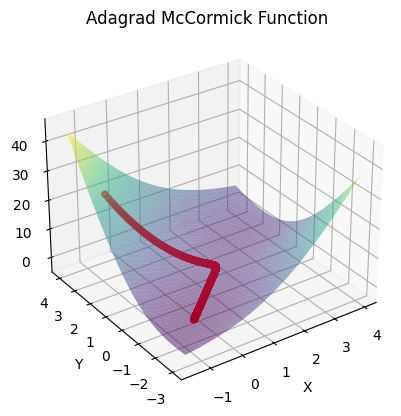

Минимум Mathias function в [-0.00054721  0.00054721]
Значение функции Mathias function в минимуме: 2.994401890140653e-07
Разница между вычисленным и из википедии
x: 0.000547211283704992, y: 0.000547211283704992, z: 2.994401890140653e-07



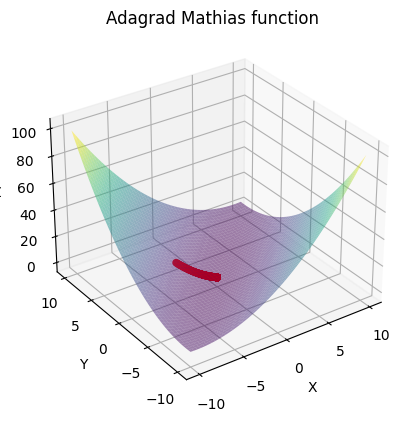

In [361]:
adagrad_trajectory_1: np.ndarray = adagrad(f1_sympy, initial_point_1, learning_rate, 2000, gradient)
adam_final_point_1 = adagrad_trajectory_1[-1]
difference(adam_final_point_1, wiki_x1, wiki_y1, wiki_z1, f1_numpy, f1_name)
show_plot(x1, y1, z1, f1_numpy, "Adagrad " + f1_name, adagrad_trajectory_1)

adagrad_trajectory_2: np.ndarray = adagrad(f2_sympy, initial_point_2, learning_rate, 2000, gradient)
adam_final_point_2 = adagrad_trajectory_2[-1]
difference(adam_final_point_2, wiki_x2, wiki_y2, wiki_z2, f2_numpy, f2_name)
show_plot(x2, y2, z2, f2_numpy, "Adagrad " + f2_name, adagrad_trajectory_2)

Метод эволюции темпа обучения

In [ ]:
def gradient_descent_with_learning_rate_evolution(
    f: Callable,
    starting_point: np.ndarray,
    initial_learning_rate: float,
    iterations: int,
    gradient: Callable[..., np.ndarray],
    decay_rate: float = 1-(1e-5)) -> np.ndarray:

    history = []
    current_point = np.array(starting_point)
    learning_rate = initial_learning_rate

    for _ in range(iterations):
        gradient_at_point = gradient(f, current_point)

        current_point -= learning_rate * gradient_at_point
        history.append(current_point.copy())

        # Эволюция темпа обучения
        learning_rate *= decay_rate

        if len(history) > 1 and np.allclose(history[-1], history[-2], atol=1e-6, rtol=1e-6):
          return np.array(history)

    return np.array(history)

Отображаем результаты метода эволюции

Минимум McCormick Function в [-0.54507352 -1.54507352]
Значение функции McCormick Function в минимуме: -1.9132151344720087
Разница между вычисленным и из википедии
x: 0.002116475963190534, y: 0.002116476003936052, z: 8.486552799125135e-05



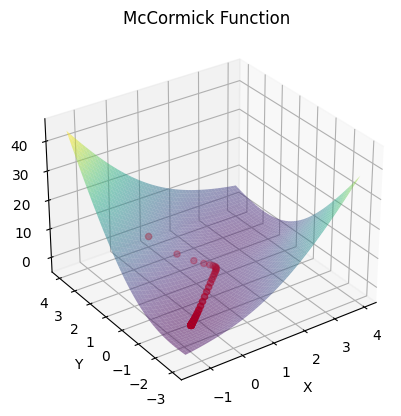

Минимум Mathias function в [-0.01548238  0.01548238]
Значение функции Mathias function в минимуме: 0.00023970411446360137
Разница между вычисленным и из википедии
x: 0.015482380775048822, y: 0.015482380775048822, z: 0.00023970411446360137



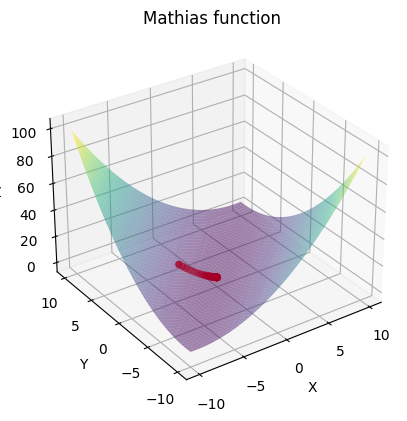

In [ ]:
evolution_trajectory_1: np.ndarray = gradient_descent_with_learning_rate_evolution(f1_sympy, initial_point_1, learning_rate, iterations, gradient)
evolution_final_point_1 = evolution_trajectory_1[-1]
difference(evolution_final_point_1, wiki_x1, wiki_y1, wiki_z1, f1_numpy, f1_name)
show_plot(x1, y1, z1, f1_numpy, f1_name, evolution_trajectory_1)

evolution_trajectory_2: np.ndarray = gradient_descent_with_learning_rate_evolution(f2_sympy, initial_point_2, learning_rate, iterations, gradient)
evolution_final_point_2 = evolution_trajectory_2[-1]
difference(evolution_final_point_2, wiki_x2, wiki_y2, wiki_z2, f2_numpy, f2_name)
show_plot(x2, y2, z2, f2_numpy, f2_name, evolution_trajectory_2)

Анимация на доп бал

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sympy import symbols, sin, lambdify

# Gradient descent function
def gradient_descent_with_animation(f, starting_point, learning_rate, iterations, gradient, ax):
    history = []
    current_point = np.array(starting_point)

    def update(frame):
        nonlocal current_point
        gradient_at_point = gradient(f, current_point)
        current_point -= learning_rate * gradient_at_point
        history.append(current_point.copy())
        ax.cla()
        ax.plot_surface(x1, y1, z1, cmap='viridis', alpha=0.5)
        ax.scatter(*current_point, f(*current_point), color='red', marker='o')
        ax.set_title(f'Iteration {frame}')
        if len(history) > 1 and np.allclose(history[-1], history[-2], atol=1e-6, rtol=1e-6):
          plt.close()
          return np.array(history), anim

    anim = FuncAnimation(plt.gcf(), update, frames=iterations, interval=500)
    plt.close()
    return np.array(history), anim

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x1, y1, z1, cmap='viridis', alpha=0.5)
ax.view_init(azim=-125)

# Initial point and parameters
starting_point = [1.0, 2.0]
learning_rate = 0.1
iterations = 50  # You can adjust the number of iterations

# Run gradient descent with animation
symbol_trajectory_animation, anim = gradient_descent_with_animation(f1_numpy, starting_point, learning_rate, iterations, numerical_gradient_approximation, ax)

# Покажем анимацию
from IPython.display import HTML
HTML(anim.to_jshtml())

#Л.Р. #2 — Глобальная оптимизация и метаэврестические алгоритмы
##В Pygmo запрогроммировать две своих тестовых функции и найти их оптимум 3 разными алгоритмами доступными в библиотеке и получить таблицу сравнения

In [ ]:
pip install pygmo

In [ ]:
import pygmo
import numpy as np

class McCormickFunction:
    def fitness(self, x):
        return [np.sin(x[0] + x[1]) + (x[0] - x[1])**2 - 1.5 * x[0] + 2.5 * x[1] + 1]

    def get_bounds(self):
        return ([-1.5, -3.0], [4.0, 4.0])

class MathiasFunction:
    def fitness(self, x):
        return [0.26 * (x[0]**2 + x[1]**2) - 0.48 * x[0] * x[1]]

    def get_bounds(self):
        return ([-10, -10], [10, 10])

In [ ]:
def optimize(algorithms: list, gens: list, problem):
    for i in range(len(algorithms)):
      prob = pg.problem(problem)
      algo = pg.algorithm(algorithms[i](gen=gens[i]))

      pop = pg.population(prob, size=100)
      result = algo.evolve(pop)

      best_solution = result.champion_x

      print(f"Алгоритм: {algorithms[i].__name__}, Функция: {problem.__class__.__name__}")
      print(f"Лучшее решение: {best_solution}")
      print(f"Значение функции: {problem.fitness(best_solution)[0]}")
      print("\n")

In [ ]:
mc_cormick = McCormickFunction()
mathias = MathiasFunction()
algorithms = [pygmo.sga, pygmo.pso, pygmo.de]

In [ ]:
mc_cormick_gens = [250]*3
optimize(algorithms, mc_cormick_gens, mc_cormick)

Алгоритм: sga, Функция: McCormickFunction
Лучшее решение: [-0.54432319 -1.54950517]
Значение функции: -1.9131959629417175


Алгоритм: pso, Функция: McCormickFunction
Лучшее решение: [-0.54719754 -1.54719755]
Значение функции: -1.9132229549810367


Алгоритм: de, Функция: McCormickFunction
Лучшее решение: [-0.5472219  -1.54723714]
Значение функции: -1.9132229529788263




In [ ]:
mathias_gens = [250]*3
optimize(algorithms, mathias_gens, mathias)

Алгоритм: sga, Функция: MathiasFunction
Лучшее решение: [0.01227128 0.011327  ]
Значение функции: 5.7917090778460535e-06


Алгоритм: pso, Функция: MathiasFunction
Лучшее решение: [8.57284246e-162 9.19186511e-162]
Значение функции: 0.0


Алгоритм: de, Функция: MathiasFunction
Лучшее решение: [-0.00011743 -0.00016749]
Значение функции: 1.4382576742796978e-09


